In [ ]:
import pandas as pd
import numpy as np
import keras as keras
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn import metrics
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
import matplotlib.pyplot as plt
import seaborn as sns
from keras.models import Sequential
from keras.layers import Dense
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.ensemble import RandomForestClassifier

In [ ]:
#Loading csv
teams_df = pd.read_csv("nba_team_stats_00_to_21.csv")
print(teams_df)

     teamstatspk                   TEAM  GP   W   L   WIN%   MIN    PTS   FGM  \
0              0           Phoenix Suns  52  42  10  0.808  48.1  112.7  42.7   
1              1  Golden State Warriors  53  40  13  0.755  48.2  110.9  40.4   
2              2      Memphis Grizzlies  55  37  18  0.673  48.3  112.7  42.7   
3              3             Miami Heat  54  34  20  0.630  48.5  108.7  39.3   
4              4          Chicago Bulls  53  33  20  0.623  48.1  111.6  41.6   
..           ...                    ...  ..  ..  ..    ...   ...    ...   ...   
621          621          Atlanta Hawks  82  25  57  0.305  48.1   91.0  35.1   
622          622    Vancouver Grizzlies  82  23  59  0.280  48.2   91.7  35.0   
623          623     Washington Wizards  82  19  63  0.232  48.0   93.2  34.5   
624          624  Golden State Warriors  82  17  65  0.207  48.2   92.5  35.8   
625          625          Chicago Bulls  82  15  67  0.183  48.4   87.6  33.2   

      FGA  ...   REB   AST 

In [ ]:
#Preprocessing: Adding information regarding of the teams won that year's championship or not, and inputting appropriate values based on which team won the finals
zeros = [0 for _ in range(626)]
teams_df['WON_FINALS'] = zeros
print(teams_df)
teams_df.to_csv('nba_team_stats_00_to_21_processed')

     teamstatspk                   TEAM  GP   W   L   WIN%   MIN    PTS   FGM  \
0              0           Phoenix Suns  52  42  10  0.808  48.1  112.7  42.7   
1              1  Golden State Warriors  53  40  13  0.755  48.2  110.9  40.4   
2              2      Memphis Grizzlies  55  37  18  0.673  48.3  112.7  42.7   
3              3             Miami Heat  54  34  20  0.630  48.5  108.7  39.3   
4              4          Chicago Bulls  53  33  20  0.623  48.1  111.6  41.6   
..           ...                    ...  ..  ..  ..    ...   ...    ...   ...   
621          621          Atlanta Hawks  82  25  57  0.305  48.1   91.0  35.1   
622          622    Vancouver Grizzlies  82  23  59  0.280  48.2   91.7  35.0   
623          623     Washington Wizards  82  19  63  0.232  48.0   93.2  34.5   
624          624  Golden State Warriors  82  17  65  0.207  48.2   92.5  35.8   
625          625          Chicago Bulls  82  15  67  0.183  48.4   87.6  33.2   

      FGA  ...   AST   TOV 

In [ ]:
#Values punched in by hand, each team has its associated value for whether or not they won the finals or not in that season
teams_df = pd.read_csv("nba_team_stats_00_to_21_postprocessed.csv", index_col=0)
#teams_df = pd.get_dummies(teams_df, columns=['TEAM','SEASON'])
print(teams_df)

     teamstatspk                   TEAM  GP   W   L   WIN%   MIN    PTS   FGM  \
0              0           Phoenix Suns  52  42  10  0.808  48.1  112.7  42.7   
1              1  Golden State Warriors  53  40  13  0.755  48.2  110.9  40.4   
2              2      Memphis Grizzlies  55  37  18  0.673  48.3  112.7  42.7   
3              3             Miami Heat  54  34  20  0.630  48.5  108.7  39.3   
4              4          Chicago Bulls  53  33  20  0.623  48.1  111.6  41.6   
..           ...                    ...  ..  ..  ..    ...   ...    ...   ...   
621          621          Atlanta Hawks  82  25  57  0.305  48.1   91.0  35.1   
622          622    Vancouver Grizzlies  82  23  59  0.280  48.2   91.7  35.0   
623          623     Washington Wizards  82  19  63  0.232  48.0   93.2  34.5   
624          624  Golden State Warriors  82  17  65  0.207  48.2   92.5  35.8   
625          625          Chicago Bulls  82  15  67  0.183  48.4   87.6  33.2   

      FGA  ...   AST   TOV 

<ipython-input-6-6936d5727118>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(teams_df.corr())


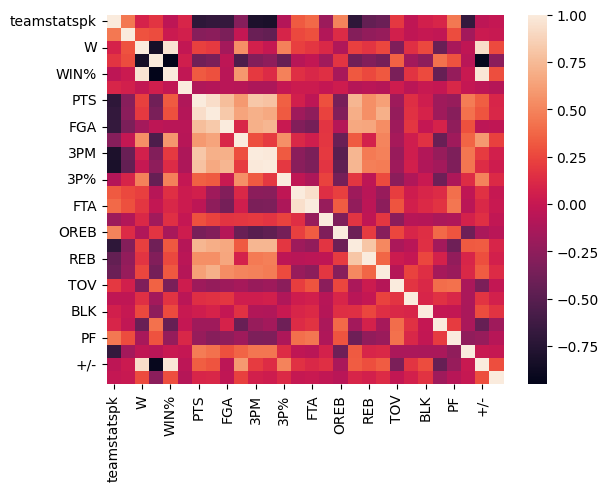

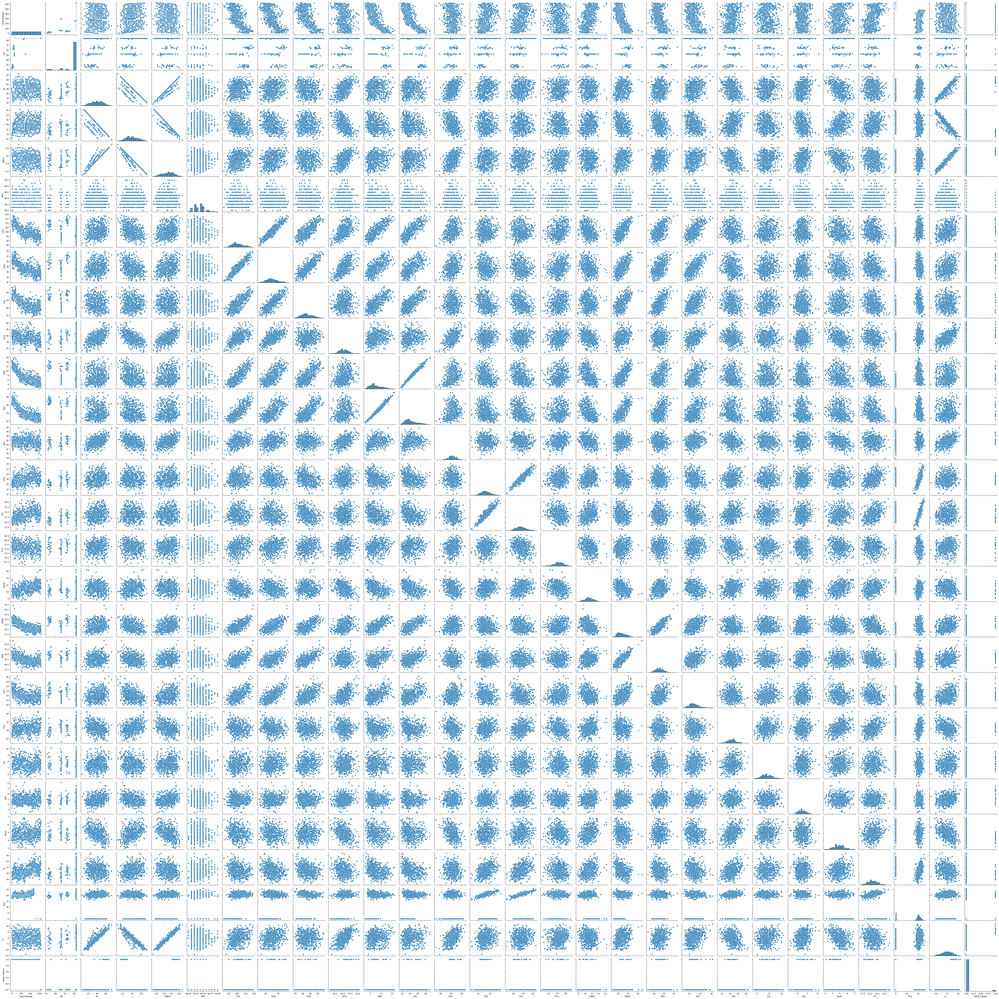

In [ ]:
#Observe correlation
sns.heatmap(teams_df.corr())
sns.pairplot(teams_df)

In [ ]:
selected = ['2017-18','2000-01','2013-14','2015-16','2007-08']

training_rows = teams_df[teams_df["SEASON"].str.contains("2017-18|2000-01|2013-14|2015-16|2007-08") == False]
x_train = training_rows.drop(['WON_FINALS', 'SEASON', 'teamstatspk'],axis=1)
x_train = pd.get_dummies(x_train, columns=['TEAM'])
y_train = training_rows['WON_FINALS']
x_train_2 = x_train
y_train_2 = y_train
print(x_train)
print(y_train)

testing_rows = teams_df[teams_df["SEASON"].str.contains("2017-18|2000-01|2013-14|2015-16|2007-08") == True]
x_test = testing_rows.drop(['WON_FINALS', 'SEASON', 'teamstatspk'],axis=1)
x_test = pd.get_dummies(x_test, columns=['TEAM'])
y_test = testing_rows['WON_FINALS']
x_test_2 = x_test
y_test_2 = y_test
print(x_test)
print(y_test)



     GP   W   L   WIN%   MIN    PTS   FGM   FGA   FG%   3PM  ...  \
0    52  42  10  0.808  48.1  112.7  42.7  89.4  47.8  11.5  ...   
1    53  40  13  0.755  48.2  110.9  40.4  86.5  46.7  14.6  ...   
2    55  37  18  0.673  48.3  112.7  42.7  93.4  45.7  11.1  ...   
3    54  34  20  0.630  48.5  108.7  39.3  85.7  45.9  13.5  ...   
4    53  33  20  0.623  48.1  111.6  41.6  87.0  47.8  11.2  ...   
..   ..  ..  ..    ...   ...    ...   ...   ...   ...   ...  ...   
592  82  28  54  0.341  48.7   92.3  34.6  80.8  42.8   6.0  ...   
593  82  27  55  0.329  48.3   92.2  35.5  83.8  42.4   5.2  ...   
594  82  23  59  0.280  48.2   89.9  34.8  79.7  43.6   4.1  ...   
595  82  21  61  0.256  48.3   89.5  34.3  79.2  43.3   3.7  ...   
596  82  21  61  0.256  48.2   97.7  36.6  85.2  42.9   3.9  ...   

     TEAM_Orlando Magic  TEAM_Philadelphia 76ers  TEAM_Phoenix Suns  \
0                     0                        0                  1   
1                     0                  

In [ ]:
#Implementing Neural Network Model to try and predict the winner
model = Sequential()
model.add(Dense(128, input_shape=(x_train.shape[1],), activation='relu'))
model.add(Dense(64,activation = 'relu'))
model.add(Dense(32, activation = 'relu'))
model.add(Dense(1, activation="sigmoid"))
model.compile(loss='binary_crossentropy', optimizer="adam", metrics=["accuracy"])
model.fit(x_train, y_train, epochs = 15, batch_size = 32)

train_loss, train_accuracy = model.evaluate(x_train, y_train, verbose=0)
print('Training Accuracy:', train_accuracy)
test_loss, test_accuracy = model.evaluate(x_test, y_test, verbose=0)
print('Testing Accuracy:', test_accuracy)

Epoch 1/15
15/15 [==============================] - 1s 3ms/step - loss: 0.3010 - accuracy: 0.9623
Epoch 2/15
15/15 [==============================] - 0s 3ms/step - loss: 0.1299 - accuracy: 0.9623
Epoch 3/15
15/15 [==============================] - 0s 3ms/step - loss: 0.1577 - accuracy: 0.9602
Epoch 4/15
15/15 [==============================] - 0s 3ms/step - loss: 0.1747 - accuracy: 0.9686
Epoch 5/15
15/15 [==============================] - 0s 3ms/step - loss: 0.1041 - accuracy: 0.9686
Epoch 6/15
15/15 [==============================] - 0s 3ms/step - loss: 0.0993 - accuracy: 0.9706
Epoch 7/15
15/15 [==============================] - 0s 3ms/step - loss: 0.1221 - accuracy: 0.9644
Epoch 8/15
15/15 [==============================] - 0s 3ms/step - loss: 0.1203 - accuracy: 0.9560
Epoch 9/15
15/15 [==============================] - 0s 3ms/step - loss: 0.1128 - accuracy: 0.9686
Epoch 10/15
15/15 [==============================] - 0s 3ms/step - loss: 0.1188 - accuracy: 0.9560
Epoch 11/15
15/15 [

In [ ]:
predictions = model.predict(x_test)
threshold = 0.5
for i in range(len(predictions)):
    prediction = predictions[i]
    sample = x_test.iloc[i]
    if prediction > threshold:
      print("Prediction:", prediction)
      print("Sample:", sample[:])

5/5 [==============================] - 0s 3ms/step


In [ ]:
#Adding more layers to see if the predictions improve
model = Sequential()
model.add(Dense(128, input_shape=(x_train.shape[1],), activation='relu'))
model.add(Dense(64,activation = 'relu'))
model.add(Dense(32, activation = 'relu'))
model.add(Dense(16, activation = 'relu'))
model.add(Dense(8, activation = 'relu'))
model.add(Dense(1, activation="sigmoid"))
model.compile(loss='binary_crossentropy', optimizer="adam", metrics=["accuracy"])
model.fit(x_train_2, y_train_2, epochs = 15, batch_size = 32)

train_loss, train_accuracy = model.evaluate(x_train_2, y_train_2, verbose=0)
print('Training Accuracy:', train_accuracy)
test_loss, test_accuracy = model.evaluate(x_test_2, y_test_2, verbose=0)
print('Testing Accuracy:', test_accuracy)

Epoch 1/15
15/15 [==============================] - 1s 2ms/step - loss: 0.1739 - accuracy: 0.9644
Epoch 2/15
15/15 [==============================] - 0s 3ms/step - loss: 0.1314 - accuracy: 0.9665
Epoch 3/15
15/15 [==============================] - 0s 2ms/step - loss: 0.1152 - accuracy: 0.9665
Epoch 4/15
15/15 [==============================] - 0s 3ms/step - loss: 0.0980 - accuracy: 0.9665
Epoch 5/15
15/15 [==============================] - 0s 2ms/step - loss: 0.1229 - accuracy: 0.9644
Epoch 6/15
15/15 [==============================] - 0s 2ms/step - loss: 0.1571 - accuracy: 0.9581
Epoch 7/15
15/15 [==============================] - 0s 2ms/step - loss: 0.1195 - accuracy: 0.9644
Epoch 8/15
15/15 [==============================] - 0s 2ms/step - loss: 0.0992 - accuracy: 0.9665
Epoch 9/15
15/15 [==============================] - 0s 2ms/step - loss: 0.1178 - accuracy: 0.9686
Epoch 10/15
15/15 [==============================] - 0s 2ms/step - loss: 0.1012 - accuracy: 0.9727
Epoch 11/15
15/15 [

In [ ]:
predictions = model.predict(x_test_2)
threshold = 0.5
for i in range(len(predictions)):
    prediction = predictions[i]
    sample = x_test.iloc[i]
    if prediction > threshold:
      print("Prediction:", prediction)
      print("Sample:", sample[:])


5/5 [==============================] - 0s 3ms/step
Prediction: [0.5360431]
Sample: GP                          82.000
W                           65.000
L                           17.000
WIN%                         0.793
MIN                         48.200
                             ...  
TEAM_Seattle SuperSonics     0.000
TEAM_Toronto Raptors         0.000
TEAM_Utah Jazz               0.000
TEAM_Vancouver Grizzlies     0.000
TEAM_Washington Wizards      0.000
Name: 90, Length: 62, dtype: float64
Prediction: [0.8152299]
Sample: GP                          82.00
W                           73.00
L                            9.00
WIN%                         0.89
MIN                         48.50
                            ...  
TEAM_Seattle SuperSonics     0.00
TEAM_Toronto Raptors         0.00
TEAM_Utah Jazz               0.00
TEAM_Vancouver Grizzlies     0.00
TEAM_Washington Wizards      0.00
Name: 150, Length: 62, dtype: float64
Prediction: [0.6606669]
Sample: GP                 

In [ ]:
#RANDOM FOREST
data = pd.read_csv('nba_team_stats_00_to_21_postprocessed.csv')
selected = ['2017-18','2000-01','2013-14','2015-16','2007-08']
data = data.drop(['Unnamed: 0'],axis=1)
trainingDF = data[data["SEASON"].str.contains("2017-18|2000-01|2013-14|2015-16|2007-08") == False]
print(trainingDF)
testingDF = data[data["SEASON"].str.contains("2017-18|2000-01|2013-14|2015-16|2007-08") == True]
print(testingDF)

     teamstatspk                   TEAM  GP   W   L   WIN%   MIN    PTS   FGM  \
0              0           Phoenix Suns  52  42  10  0.808  48.1  112.7  42.7   
1              1  Golden State Warriors  53  40  13  0.755  48.2  110.9  40.4   
2              2      Memphis Grizzlies  55  37  18  0.673  48.3  112.7  42.7   
3              3             Miami Heat  54  34  20  0.630  48.5  108.7  39.3   
4              4          Chicago Bulls  53  33  20  0.623  48.1  111.6  41.6   
..           ...                    ...  ..  ..  ..    ...   ...    ...   ...   
592          592        Houston Rockets  82  28  54  0.341  48.7   92.3  34.6   
593          593         Denver Nuggets  82  27  55  0.329  48.3   92.2  35.5   
594          594      Memphis Grizzlies  82  23  59  0.280  48.2   89.9  34.8   
595          595          Chicago Bulls  82  21  61  0.256  48.3   89.5  34.3   
596          596  Golden State Warriors  82  21  61  0.256  48.2   97.7  36.6   

      FGA  ...   AST   TOV 

In [ ]:
trainDF = trainingDF.drop(['teamstatspk','GP','TEAM','W','L','SEASON'],axis=1)
testDF = testingDF.drop(['teamstatspk','GP','TEAM','W','L','SEASON'],axis=1)


In [ ]:
trainX = trainDF.drop(['WON_FINALS'],axis=1)
trainY = trainDF['WON_FINALS']
print(trainX.dtypes)

WIN%    float64
MIN     float64
PTS     float64
FGM     float64
FGA     float64
FG%     float64
3PM     float64
3PA     float64
3P%     float64
FTM     float64
FTA     float64
FT%     float64
OREB    float64
DREB    float64
REB     float64
AST     float64
TOV     float64
STL     float64
BLK     float64
BLKA    float64
PF      float64
PFD     float64
+/-     float64
dtype: object


In [ ]:
clf =  RandomForestClassifier(oob_score=True,bootstrap=True)
errors = []
estimators = []
for i in range(100,200):
    clf.set_params(n_estimators=i)
    clf.fit(trainX, trainY)
    estimators.append(i)
    oob_error = 1 - clf.oob_score_
    errors.append(oob_error)

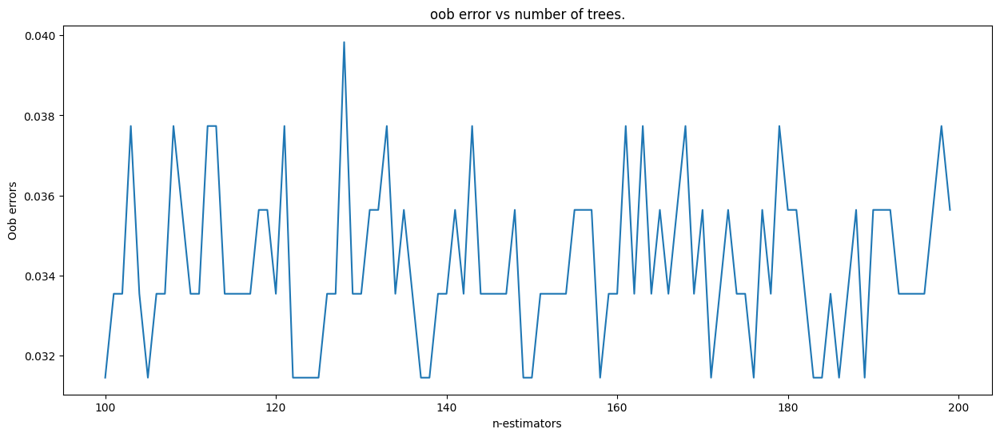

In [ ]:
plt.figure(figsize=(15,6))
plt.plot(estimators, errors)
plt.xlabel("n-estimators")  # add X-axis label
plt.ylabel("Oob errors")  # add Y-axis label
plt.title("oob error vs number of trees.")
plt.show(estimators,errors)

In [ ]:
for i in range(0,100):
    if errors[i] < 0.032:
        print(str(estimators[i]) + ": " + str(errors[i]))

100: 0.03144654088050314
105: 0.03144654088050314
122: 0.03144654088050314
123: 0.03144654088050314
124: 0.03144654088050314
125: 0.03144654088050314
137: 0.03144654088050314
138: 0.03144654088050314
149: 0.03144654088050314
150: 0.03144654088050314
158: 0.03144654088050314
171: 0.03144654088050314
176: 0.03144654088050314
183: 0.03144654088050314
184: 0.03144654088050314
186: 0.03144654088050314
189: 0.03144654088050314


In [ ]:
testX = testDF.drop(['WON_FINALS'],axis=1)
testY = testDF['WON_FINALS']
clf.set_params(n_estimators=189)
clf.fit(trainX, trainY)
y_pred = clf.predict(testX)
target_names = ['Did not win championship','Won Championship']
print(classification_report(testY, y_pred, target_names=target_names))

                          precision    recall  f1-score   support

Did not win championship       0.97      1.00      0.98       144
        Won Championship       0.00      0.00      0.00         5

                accuracy                           0.97       149
               macro avg       0.48      0.50      0.49       149
            weighted avg       0.93      0.97      0.95       149



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
